In [1]:
freq = 15

In [2]:
paciente='paciente4'

In [3]:
import codigo
from codigo import utils
from codigo import model_LSTM
from codigo import model_utils
from cg_ega.cg_ega import CG_EGA

In [4]:
import pandas as pd
import numpy as np
pd.set_option('mode.chained_assignment',None)
import matplotlib.pyplot as plt
import seaborn as sns
import math

%matplotlib inline

In [5]:
import tensorflow as tf
from tensorflow import keras

In [6]:
with open('dataset/generado/'+paciente+'/array_Xtest.npy', 'rb') as f:
    array_Xtest = np.load(f)

In [7]:
len(array_Xtest)

6201

In [8]:
with open('dataset/generado/'+paciente+'/array_Ytest.npy', 'rb') as f:
    array_Ytest = np.load(f)

In [9]:
len(array_Ytest)

6201

In [10]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Pruebas Vanilla LSTM con dropout

In [11]:
model = keras.models.load_model('modelos/'+paciente+'/vanilla_dropout_balanceado.h5')

# Predicción de todo el conjunto de pruebas generales

In [12]:
len(array_Ytest)

6201

194/194 [==============================] - 1s 5ms/step


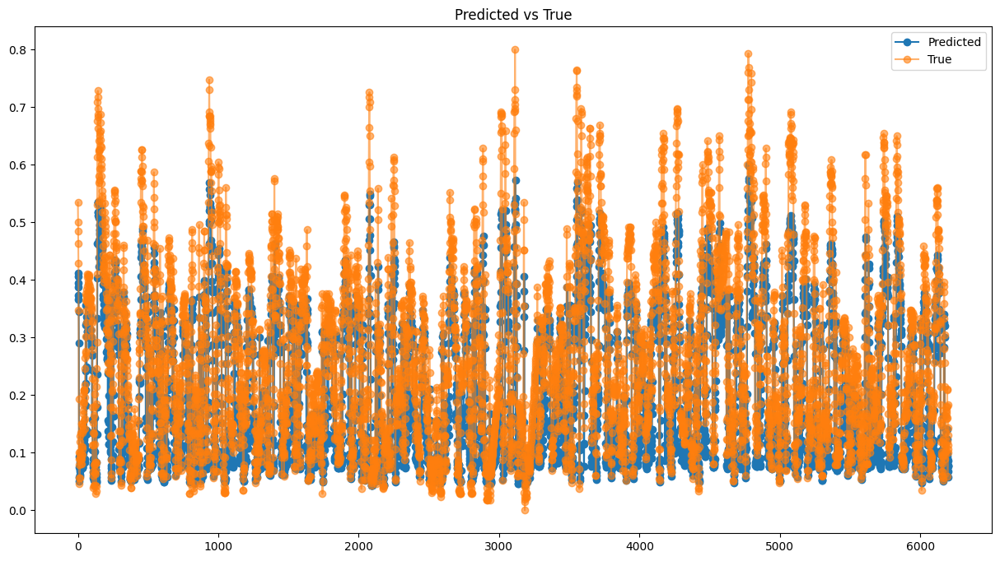

In [13]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [14]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.07601867942514268,
 'mse': 0.09587774476329491,
 'rmse': 0.009192541940895525}

In [15]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,221.356827
1,226.882126
2,229.114975
3,218.337799
4,211.722244
...,...
6196,66.558884
6197,70.914520
6198,75.183548
6199,75.670105


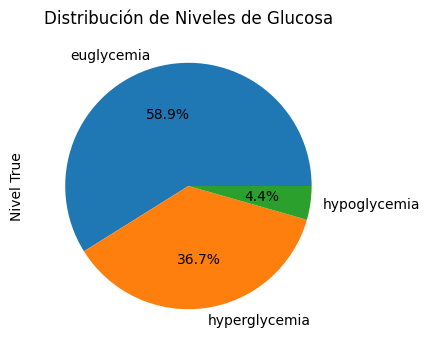

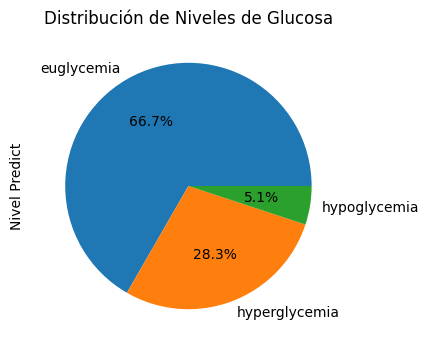

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,221.356827,hyperglycemia
1,270.0,hyperglycemia,226.882126,hyperglycemia
2,263.0,hyperglycemia,229.114975,hyperglycemia
3,253.0,hyperglycemia,218.337799,hyperglycemia
4,237.0,hyperglycemia,211.722244,hyperglycemia


In [16]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


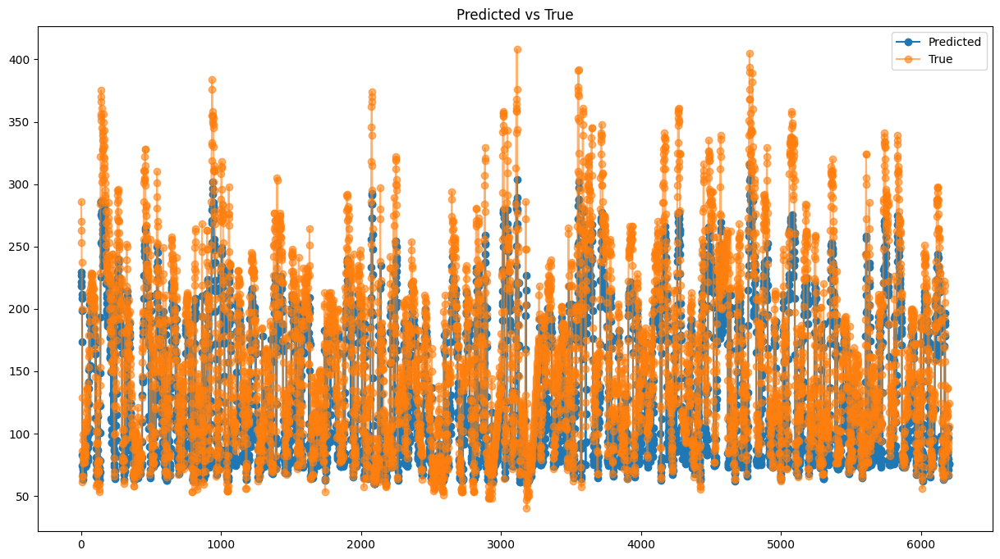

{'mae': 34.9685922430934, 'mse': 44.10376240802648, 'rmse': 1945.1418585436497}

In [17]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [18]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [19]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,221.356827
2023-01-01 00:15:00,270.0,226.882126
2023-01-01 00:30:00,263.0,229.114975
2023-01-01 00:45:00,253.0,218.337799
2023-01-01 01:00:00,237.0,211.722244
...,...,...
2023-03-06 13:00:00,100.0,66.558884
2023-03-06 13:15:00,89.0,70.914520
2023-03-06 13:30:00,92.0,75.183548
2023-03-06 13:45:00,106.0,75.670105


AP, BE, EP: (0.8753225806451613, 0.08758064516129033, 0.037096774193548385)


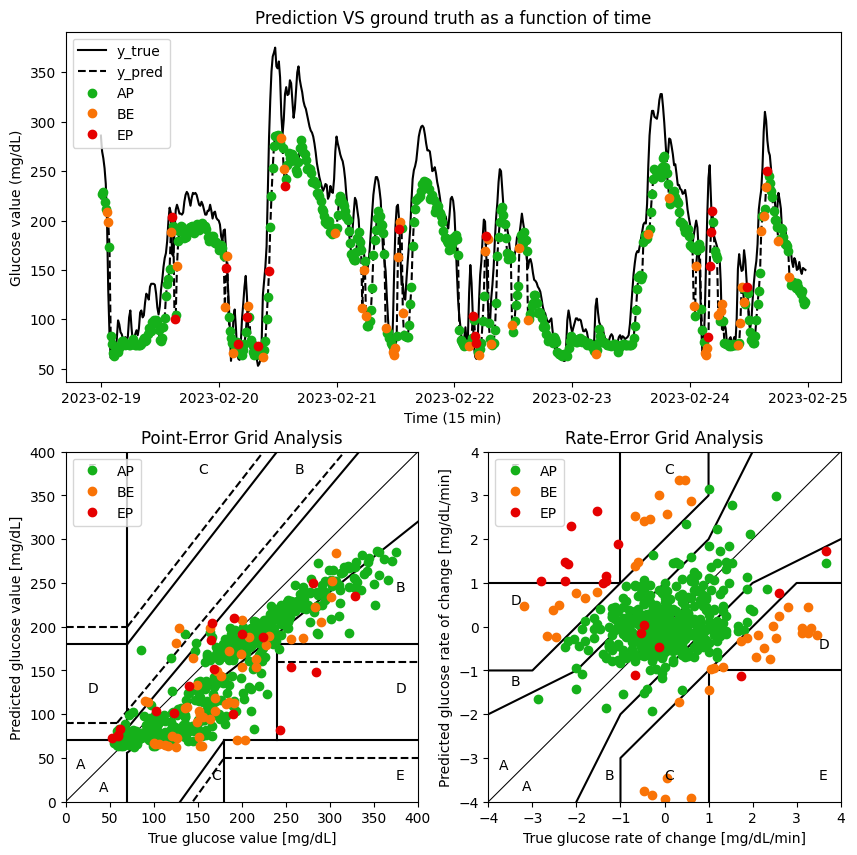

In [20]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [21]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,286.0,221.356827,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,270.0,226.882126,-1.066667,0.368353,AP,A,B
2,2023-02-19 00:30:00,263.0,229.114975,-0.466667,0.148857,AP,A,A
3,2023-02-19 00:45:00,253.0,218.337799,-0.666667,-0.718478,AP,A,A
4,2023-02-19 01:00:00,237.0,211.722244,-1.066667,-0.441037,AP,A,A
...,...,...,...,...,...,...,...,...
6196,2023-04-24 13:00:00,100.0,66.558884,0.933333,-0.876244,AP,B,B
6197,2023-04-24 13:15:00,89.0,70.914520,-0.733333,0.290376,AP,B,B
6198,2023-04-24 13:30:00,92.0,75.183548,0.200000,0.284602,AP,A,A
6199,2023-04-24 13:45:00,106.0,75.670105,0.933333,0.032437,AP,B,A


# Predicción a 60 min del conjunto de pruebas generales

In [22]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [23]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 49ms/step


,Glucose level Predict,Glucose level True
0,0.394254,0.534783
1,0.406265,0.500000


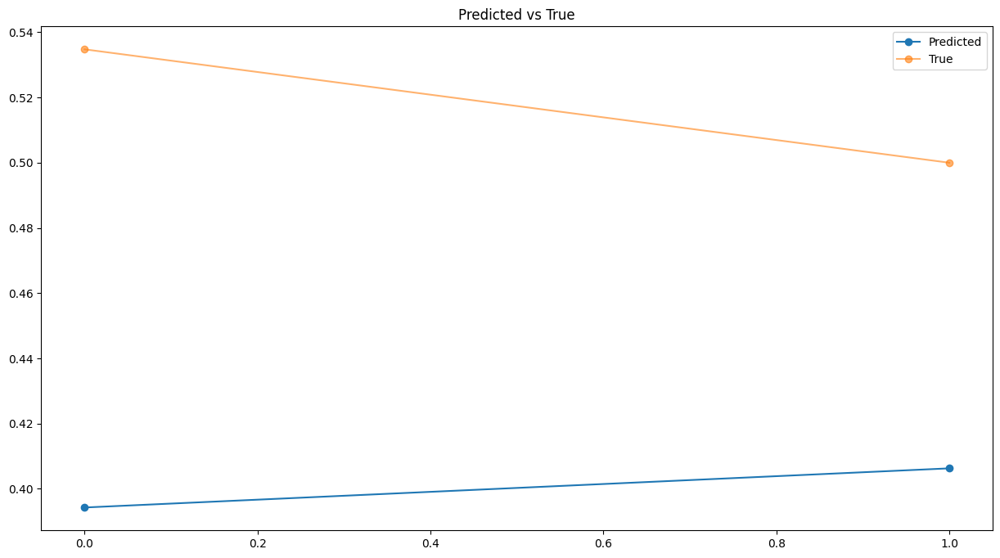

{'mae': 0.11713160095007524,
 'mse': 0.11944553046788593,
 'rmse': 0.014267234748754668}

In [24]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [25]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,221.356812,286.0
1,226.882126,270.0


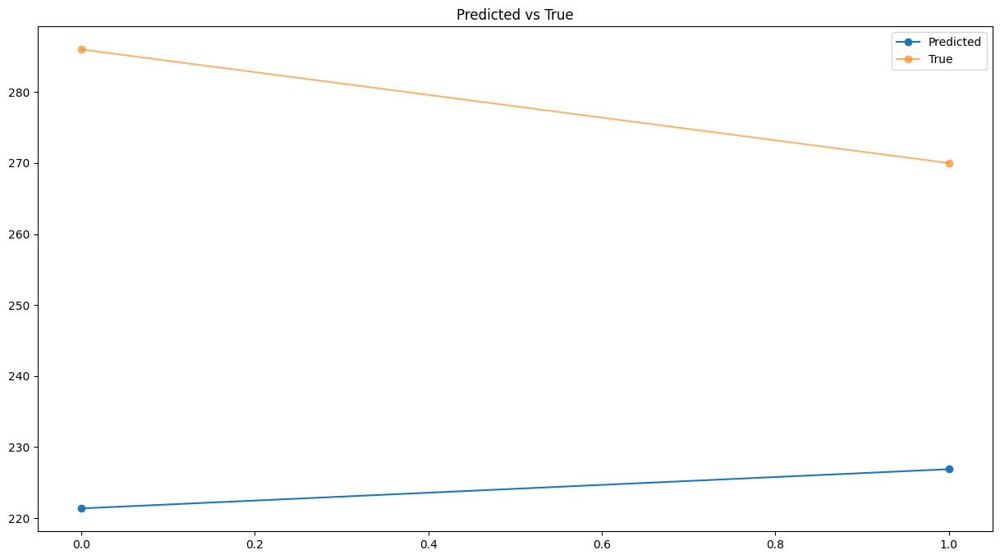

{'mae': 53.88053131103513, 'mse': 54.94494010936871, 'rmse': 3018.946443622114}

In [26]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Vanilla LSTM sin dropout

In [27]:
model = keras.models.load_model('modelos/'+paciente+'/vanilla_NO_dropout_balanceado.h5')

# Predicción de todo el conjunto de pruebas generales

In [28]:
len(array_Ytest)

6201

194/194 [==============================] - 2s 10ms/step


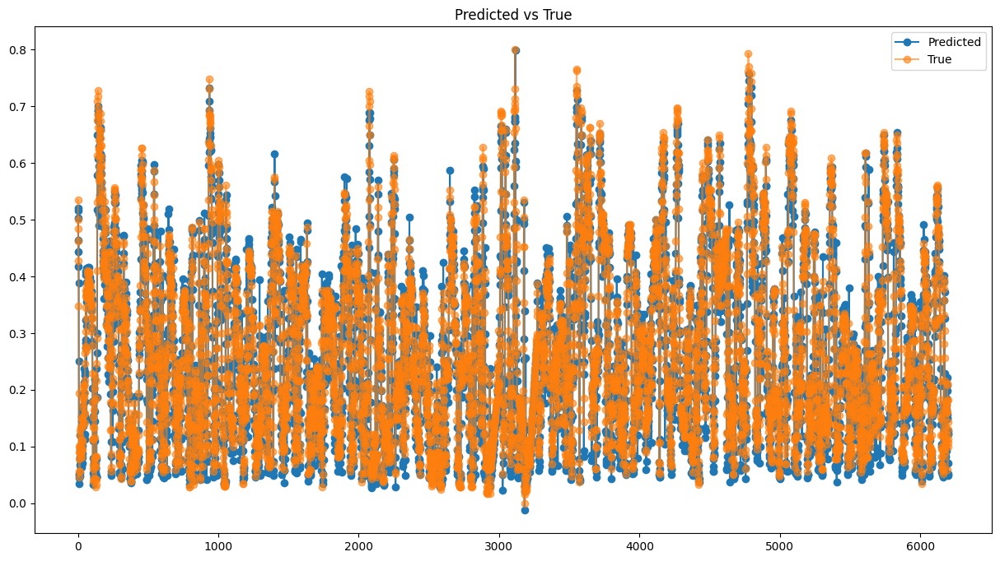

In [29]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [30]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.03839967148634183,
 'mse': 0.05531140869034646,
 'rmse': 0.003059351931310534}

In [31]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,279.088776
1,277.344604
2,271.539246
3,244.097580
4,253.447281
...,...
6196,62.487461
6197,96.301193
6198,95.959496
6199,72.734001


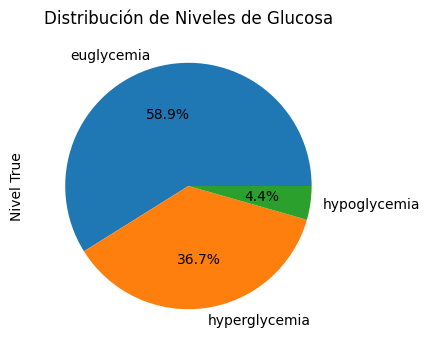

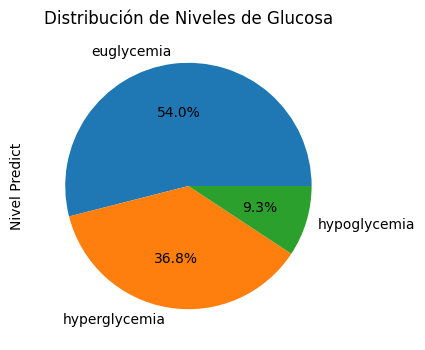

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,279.088776,hyperglycemia
1,270.0,hyperglycemia,277.344604,hyperglycemia
2,263.0,hyperglycemia,271.539246,hyperglycemia
3,253.0,hyperglycemia,244.097580,hyperglycemia
4,237.0,hyperglycemia,253.447281,hyperglycemia


In [32]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


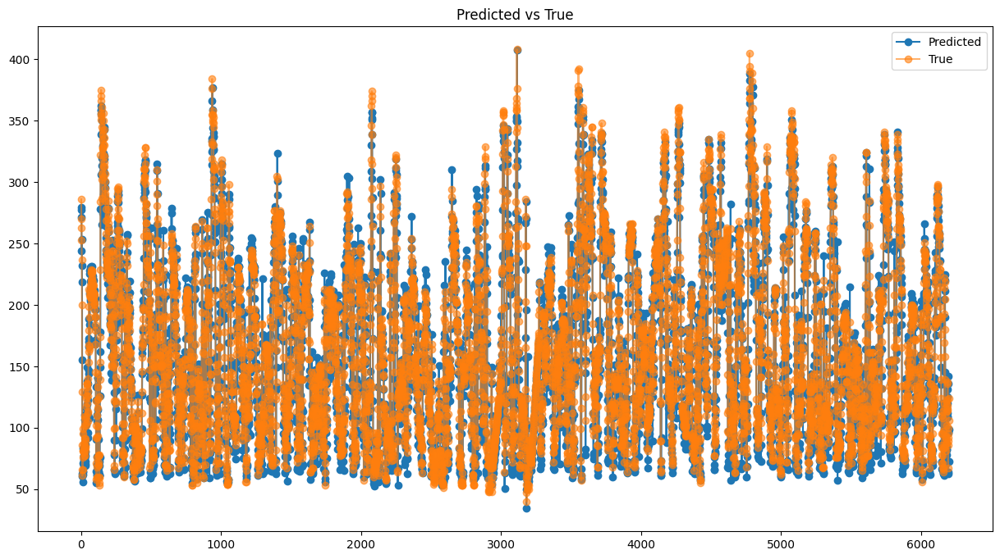

{'mae': 17.663849518170043, 'mse': 25.4432485566895, 'rmse': 647.3588971174823}

In [33]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [34]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [35]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,279.088776
2023-01-01 00:15:00,270.0,277.344604
2023-01-01 00:30:00,263.0,271.539246
2023-01-01 00:45:00,253.0,244.097580
2023-01-01 01:00:00,237.0,253.447281
...,...,...
2023-03-06 13:00:00,100.0,62.487461
2023-03-06 13:15:00,89.0,96.301193
2023-03-06 13:30:00,92.0,95.959496
2023-03-06 13:45:00,106.0,72.734001


AP, BE, EP: (0.8440322580645161, 0.1132258064516129, 0.042741935483870966)


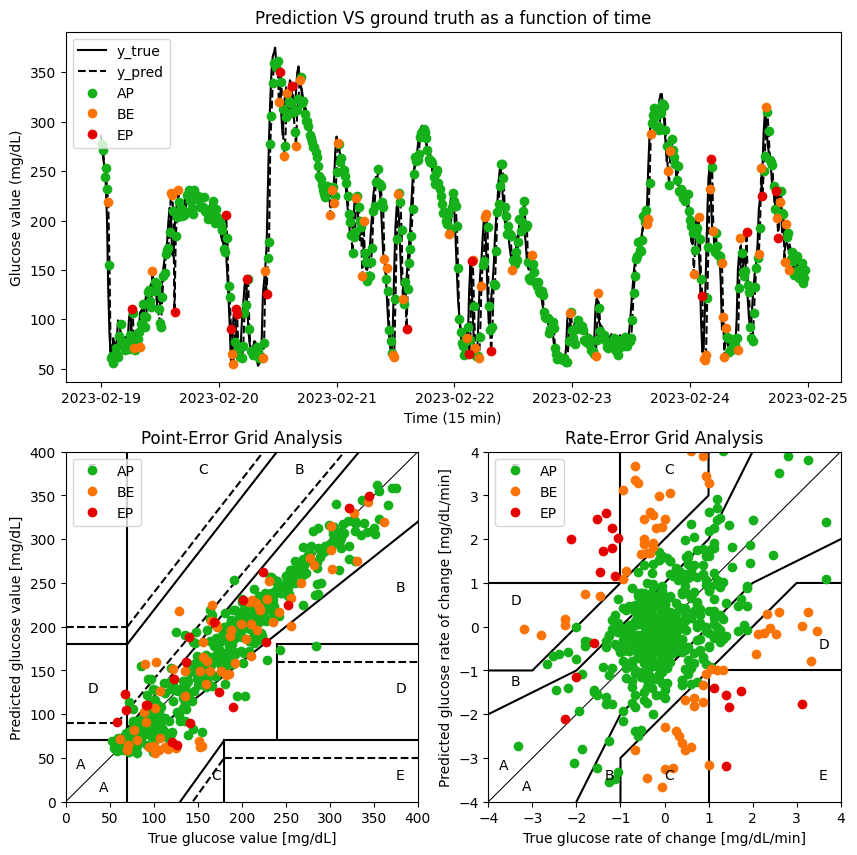

In [36]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [37]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,286.0,279.088776,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,270.0,277.344604,-1.066667,-0.116278,AP,A,A
2,2023-02-19 00:30:00,263.0,271.539246,-0.466667,-0.387024,AP,A,A
3,2023-02-19 00:45:00,253.0,244.097580,-0.666667,-1.829444,AP,A,B
4,2023-02-19 01:00:00,237.0,253.447281,-1.066667,0.623313,AP,A,B
...,...,...,...,...,...,...,...,...
6196,2023-04-24 13:00:00,100.0,62.487461,0.933333,-0.096361,AP,B,B
6197,2023-04-24 13:15:00,89.0,96.301193,-0.733333,2.254249,BE,A,uC
6198,2023-04-24 13:30:00,92.0,95.959496,0.200000,-0.022780,AP,A,A
6199,2023-04-24 13:45:00,106.0,72.734001,0.933333,-1.548366,BE,B,lC


# Predicción a 60 min del conjunto de pruebas generales

In [38]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [39]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 58ms/step


,Glucose level Predict,Glucose level True
0,0.519758,0.534783
1,0.515967,0.500000


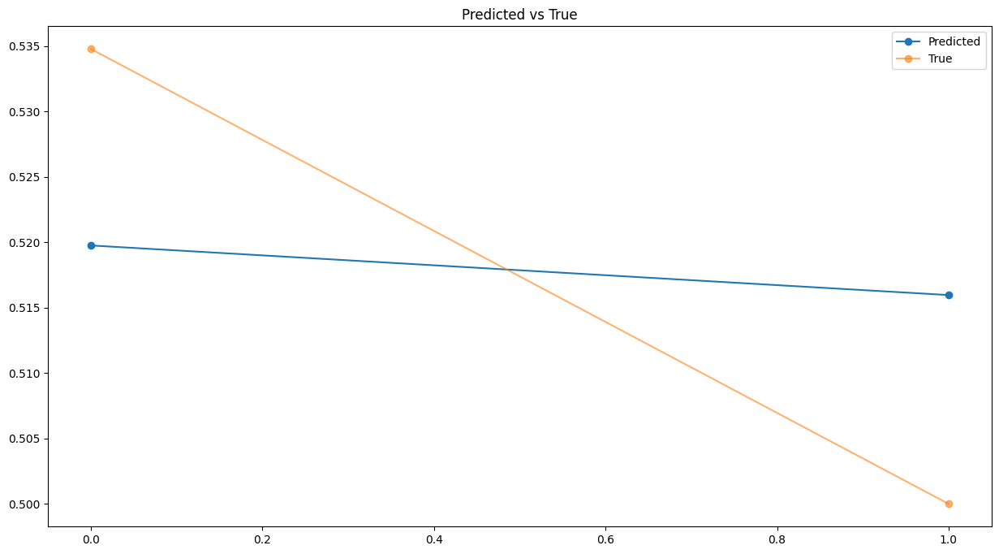

{'mae': 0.015495489213777636,
 'mse': 0.01550264899623417,
 'rmse': 0.00024033212590044036}

In [40]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [41]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,279.088776,286.0
1,277.344635,270.0


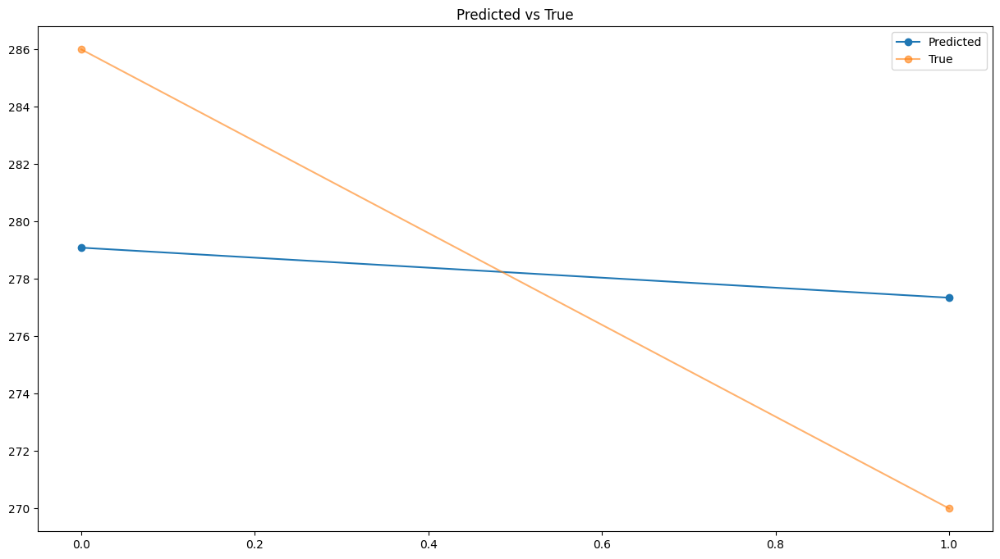

{'mae': 7.127929687500028, 'mse': 7.13122309471822, 'rmse': 50.854342826642515}

In [42]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Stacked LSTM con dropout

In [43]:
model = keras.models.load_model('modelos/'+paciente+'/stacked_dropout_balanceado.h5')

# Predicción de todo el conjunto de pruebas generales

In [44]:
len(array_Ytest)

6201

194/194 [==============================] - 4s 17ms/step


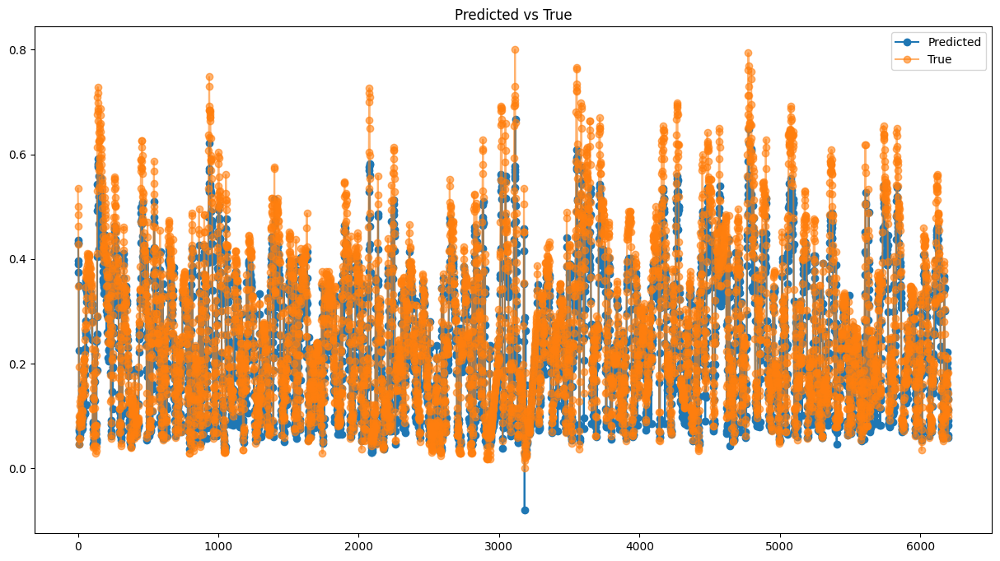

In [45]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [46]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.05019932123673549,
 'mse': 0.0675918062276539,
 'rmse': 0.004568652269116713}

In [47]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,238.380600
1,240.280975
2,237.621170
3,222.167892
4,219.302383
...,...
6196,68.735771
6197,100.962440
6198,82.132324
6199,77.544189


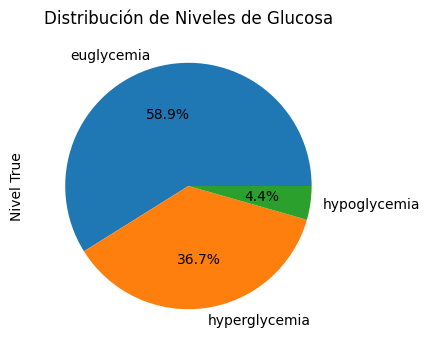

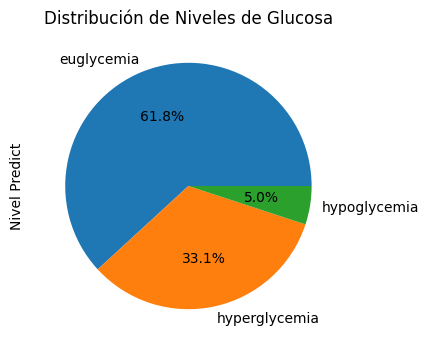

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,238.380600,hyperglycemia
1,270.0,hyperglycemia,240.280975,hyperglycemia
2,263.0,hyperglycemia,237.621170,hyperglycemia
3,253.0,hyperglycemia,222.167892,hyperglycemia
4,237.0,hyperglycemia,219.302383,hyperglycemia


In [48]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


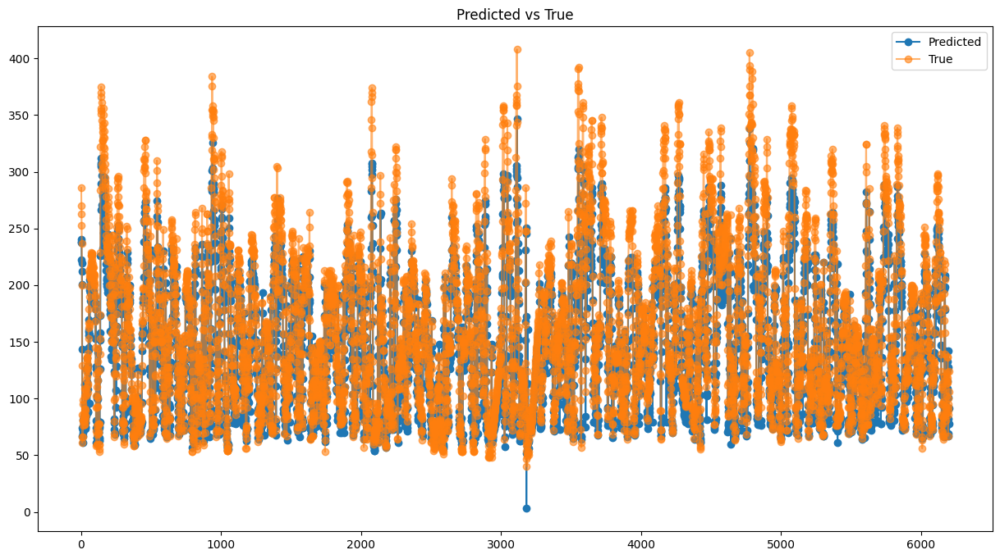

{'mae': 23.091687681841513,
 'mse': 31.092231138238137,
 'rmse': 966.7268371536252}

In [49]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [50]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [51]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,238.380600
2023-01-01 00:15:00,270.0,240.280975
2023-01-01 00:30:00,263.0,237.621170
2023-01-01 00:45:00,253.0,222.167892
2023-01-01 01:00:00,237.0,219.302383
...,...,...
2023-03-06 13:00:00,100.0,68.735771
2023-03-06 13:15:00,89.0,100.962440
2023-03-06 13:30:00,92.0,82.132324
2023-03-06 13:45:00,106.0,77.544189


AP, BE, EP: (0.8630645161290322, 0.09870967741935484, 0.0382258064516129)


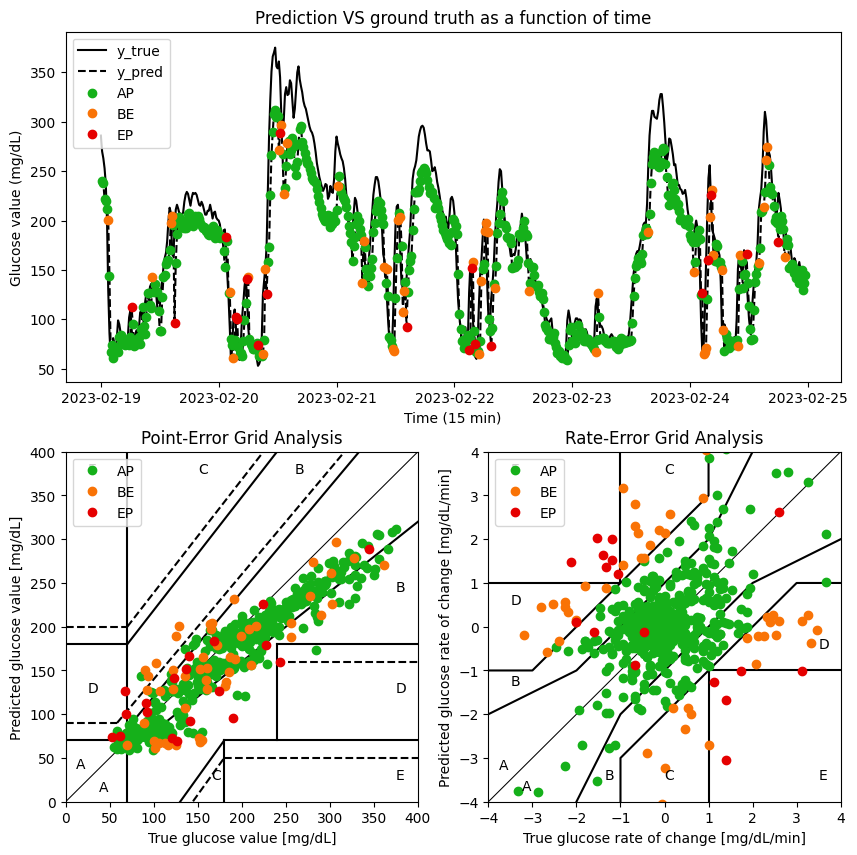

In [52]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [53]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,286.0,238.380600,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,270.0,240.280975,-1.066667,0.126692,AP,A,B
2,2023-02-19 00:30:00,263.0,237.621170,-0.466667,-0.177320,AP,A,A
3,2023-02-19 00:45:00,253.0,222.167892,-0.666667,-1.030218,AP,A,A
4,2023-02-19 01:00:00,237.0,219.302383,-1.066667,-0.191034,AP,A,A
...,...,...,...,...,...,...,...,...
6196,2023-04-24 13:00:00,100.0,68.735771,0.933333,0.099861,AP,B,A
6197,2023-04-24 13:15:00,89.0,100.962440,-0.733333,2.148445,BE,A,uC
6198,2023-04-24 13:30:00,92.0,82.132324,0.200000,-1.255341,AP,A,B
6199,2023-04-24 13:45:00,106.0,77.544189,0.933333,-0.305876,AP,B,B


# Predicción a 60 min del conjunto de pruebas generales

In [54]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [55]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 77ms/step


,Glucose level Predict,Glucose level True
0,0.431262,0.534783
1,0.435393,0.500000


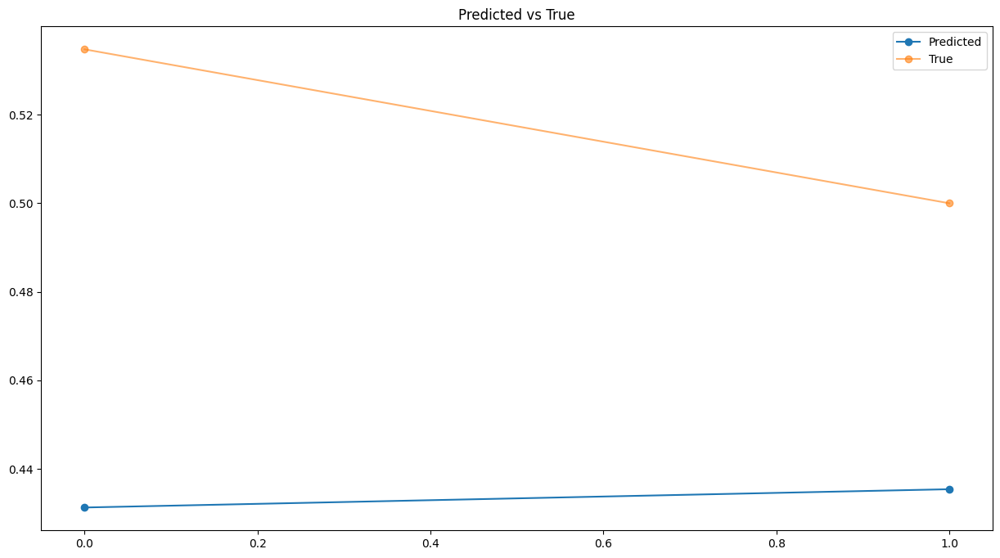

{'mae': 0.08406355497629747,
 'mse': 0.08628587915543748,
 'rmse': 0.0074452529416267595}

In [56]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [57]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,238.380569,286.0
1,240.280945,270.0


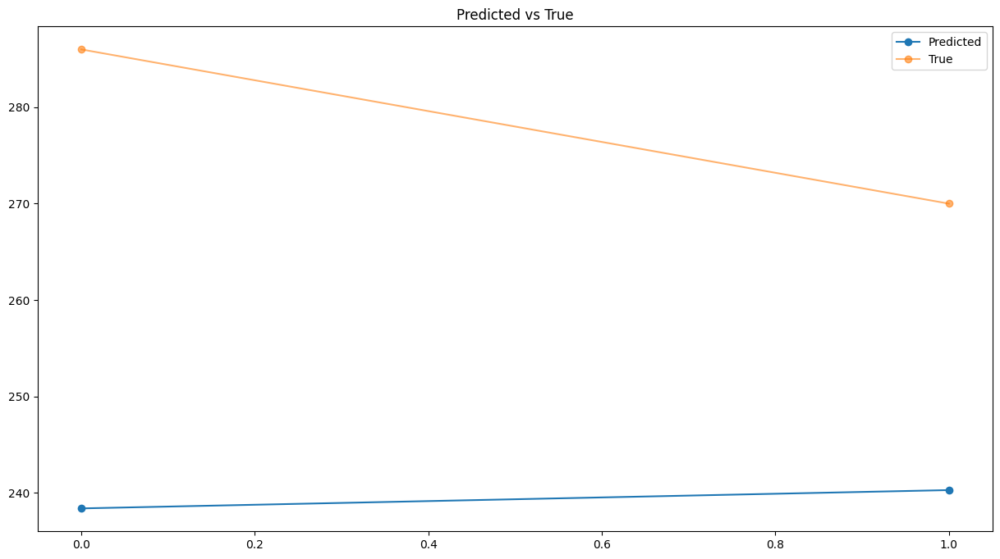

{'mae': 38.66924285888669,
 'mse': 39.69151298253031,
 'rmse': 1575.4162028423725}

In [58]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Stacked LSTM sin dropout

In [59]:
model = keras.models.load_model('modelos/'+paciente+'/stacked_NO_dropout_balanceado.h5')

# Predicción de todo el conjunto de pruebas generales

In [60]:
len(array_Ytest)

6201

194/194 [==============================] - 4s 17ms/step


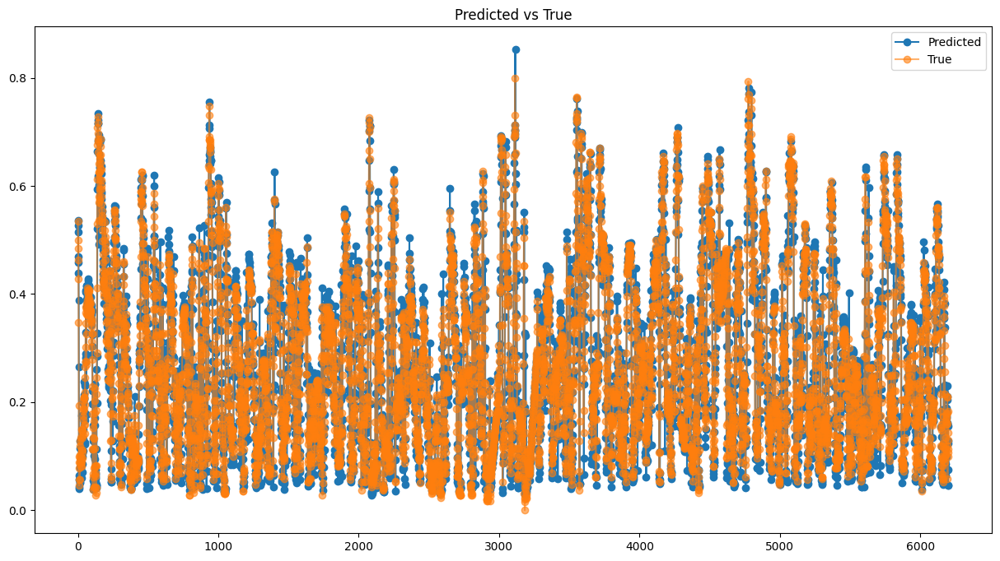

In [61]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [62]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.038002010045048745,
 'mse': 0.05471020686235341,
 'rmse': 0.0029932067349215017}

In [63]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,282.197174
1,286.447998
2,277.129028
3,250.616852
4,255.948929
...,...
6196,61.017513
6197,111.943512
6198,96.739319
6199,74.167877


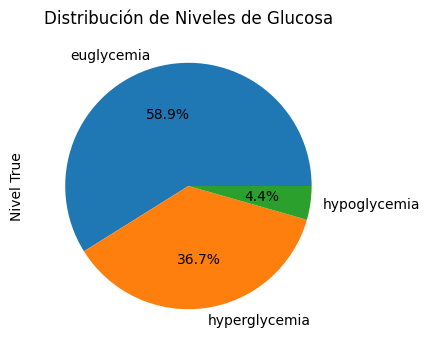

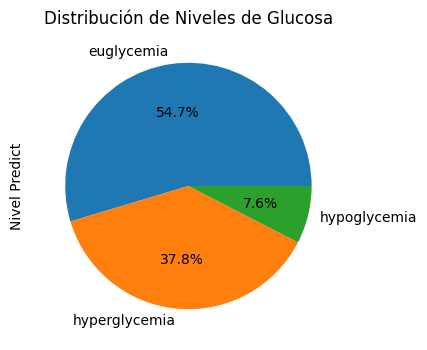

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,282.197174,hyperglycemia
1,270.0,hyperglycemia,286.447998,hyperglycemia
2,263.0,hyperglycemia,277.129028,hyperglycemia
3,253.0,hyperglycemia,250.616852,hyperglycemia
4,237.0,hyperglycemia,255.948929,hyperglycemia


In [64]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


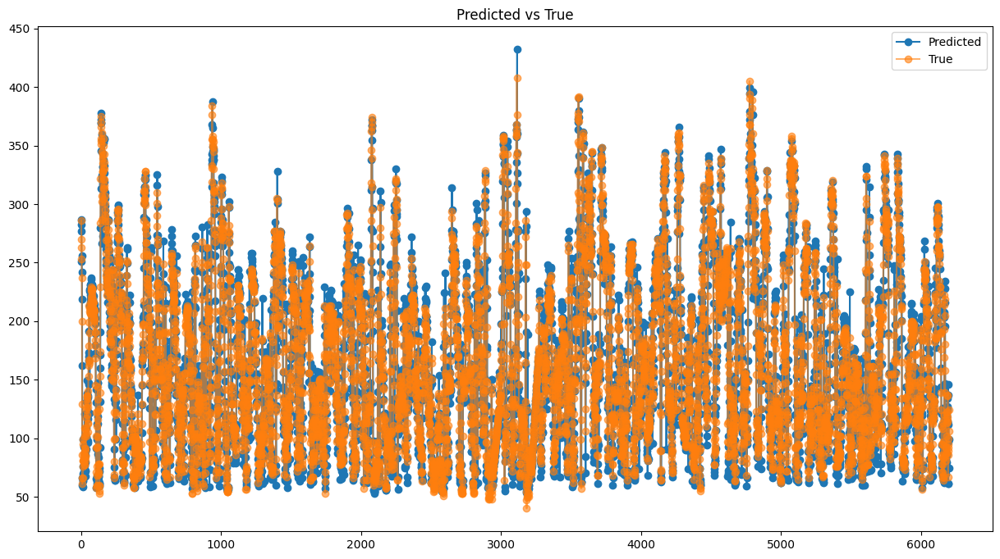

{'mae': 17.480925057211582,
 'mse': 25.166695564730052,
 'rmse': 633.3625656478032}

In [65]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [66]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [67]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,282.197174
2023-01-01 00:15:00,270.0,286.447998
2023-01-01 00:30:00,263.0,277.129028
2023-01-01 00:45:00,253.0,250.616852
2023-01-01 01:00:00,237.0,255.948929
...,...,...
2023-03-06 13:00:00,100.0,61.017513
2023-03-06 13:15:00,89.0,111.943512
2023-03-06 13:30:00,92.0,96.739319
2023-03-06 13:45:00,106.0,74.167877


AP, BE, EP: (0.8408064516129032, 0.11516129032258064, 0.044032258064516126)


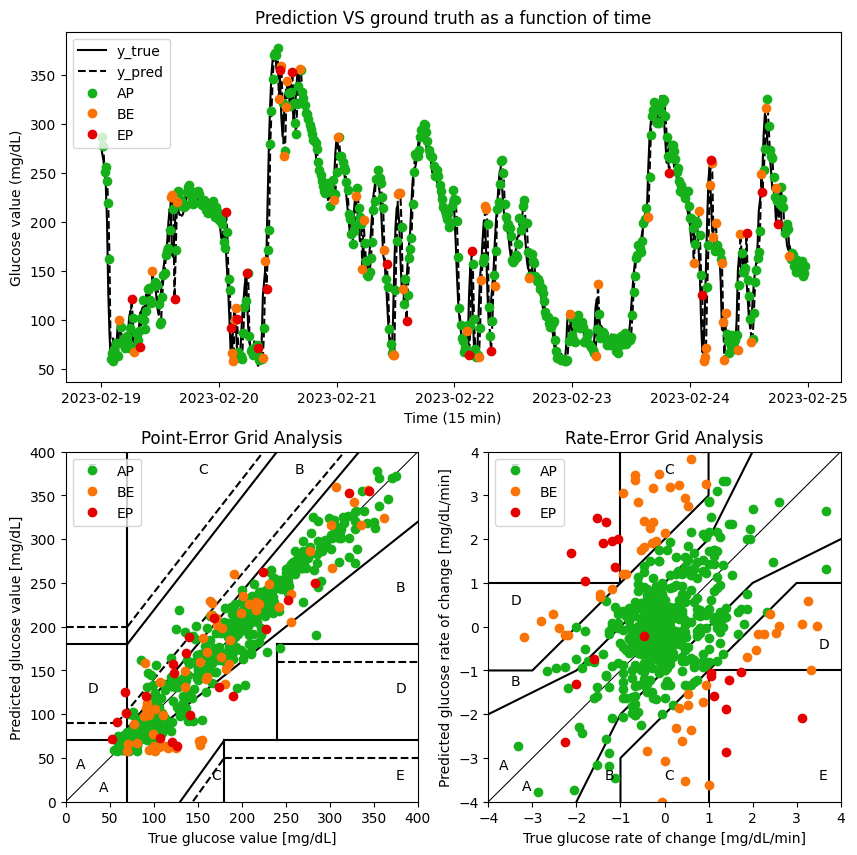

In [68]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [69]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,286.0,282.197174,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,270.0,286.447998,-1.066667,0.283388,AP,A,B
2,2023-02-19 00:30:00,263.0,277.129028,-0.466667,-0.621265,AP,A,A
3,2023-02-19 00:45:00,253.0,250.616852,-0.666667,-1.767478,AP,A,B
4,2023-02-19 01:00:00,237.0,255.948929,-1.066667,0.355472,AP,A,B
...,...,...,...,...,...,...,...,...
6196,2023-04-24 13:00:00,100.0,61.017513,0.933333,-0.002454,AP,B,A
6197,2023-04-24 13:15:00,89.0,111.943512,-0.733333,3.395066,BE,B,uC
6198,2023-04-24 13:30:00,92.0,96.739319,0.200000,-1.013613,AP,A,B
6199,2023-04-24 13:45:00,106.0,74.167877,0.933333,-1.504763,BE,B,lC


# Predicción a 60 min del conjunto de pruebas generales

In [70]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [71]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 45ms/step


,Glucose level Predict,Glucose level True
0,0.526516,0.534783
1,0.535756,0.500000


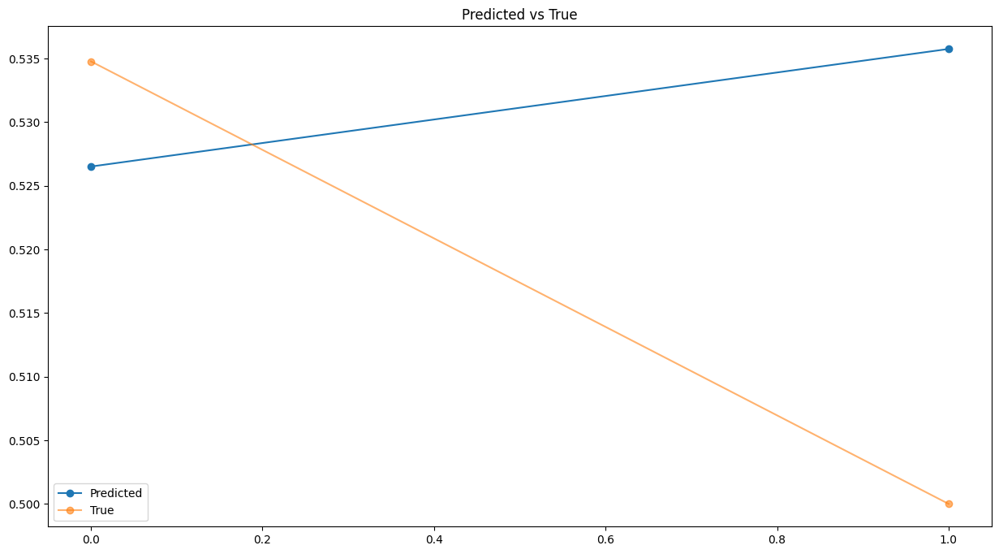

{'mae': 0.022011767003847216,
 'mse': 0.025950620673724452,
 'rmse': 0.000673434713351535}

In [72]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [73]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,282.197144,286.0
1,286.447968,270.0


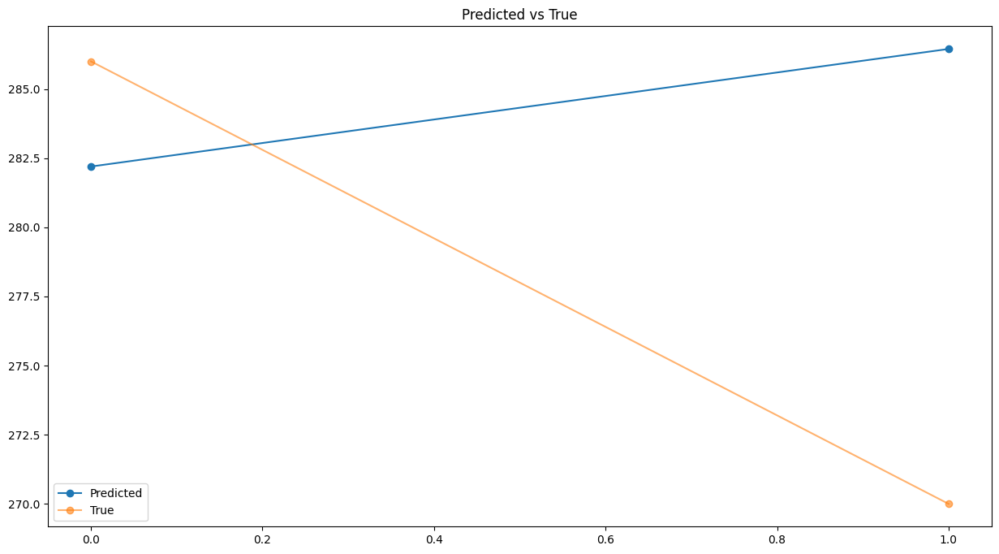

{'mae': 10.125411987304716,
 'mse': 11.937280950628184,
 'rmse': 142.49867649423052}

In [74]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Bidirectional LSTM con dropout

In [75]:
model = keras.models.load_model('modelos/'+paciente+'/bidirectional_dropout_balanceado.h5')

# Predicción de todo el conjunto de pruebas generales

In [76]:
len(array_Ytest)

6201

194/194 [==============================] - 2s 9ms/step


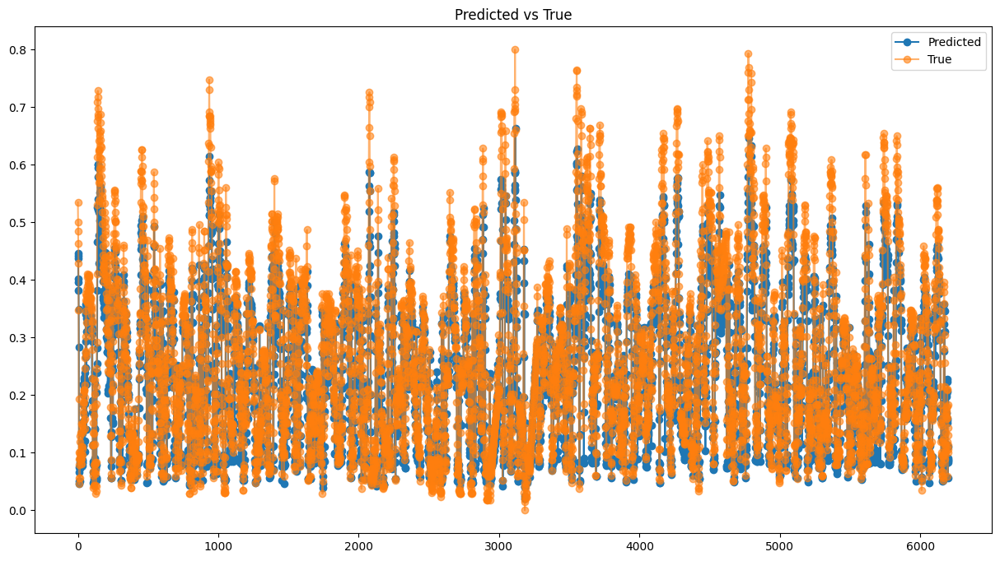

In [77]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [78]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.052060618909347725,
 'mse': 0.07025516908584489,
 'rmse': 0.004935788783280656}

In [79]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,243.076141
1,245.136459
2,240.990967
3,224.511612
4,222.372803
...,...
6196,65.641167
6197,78.055840
6198,90.951309
6199,79.681358


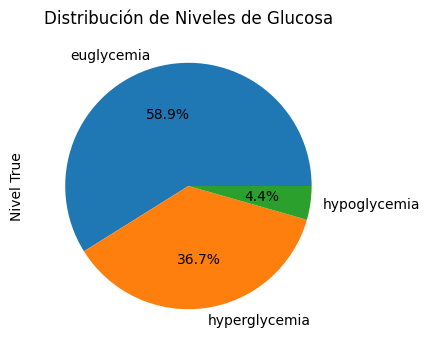

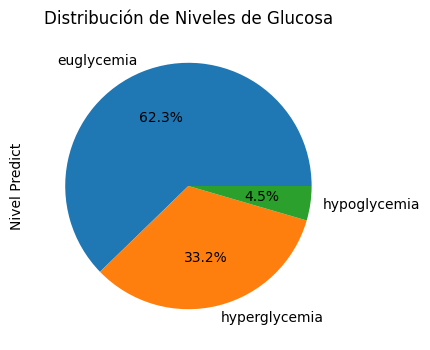

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,243.076141,hyperglycemia
1,270.0,hyperglycemia,245.136459,hyperglycemia
2,263.0,hyperglycemia,240.990967,hyperglycemia
3,253.0,hyperglycemia,224.511612,hyperglycemia
4,237.0,hyperglycemia,222.372803,hyperglycemia


In [80]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


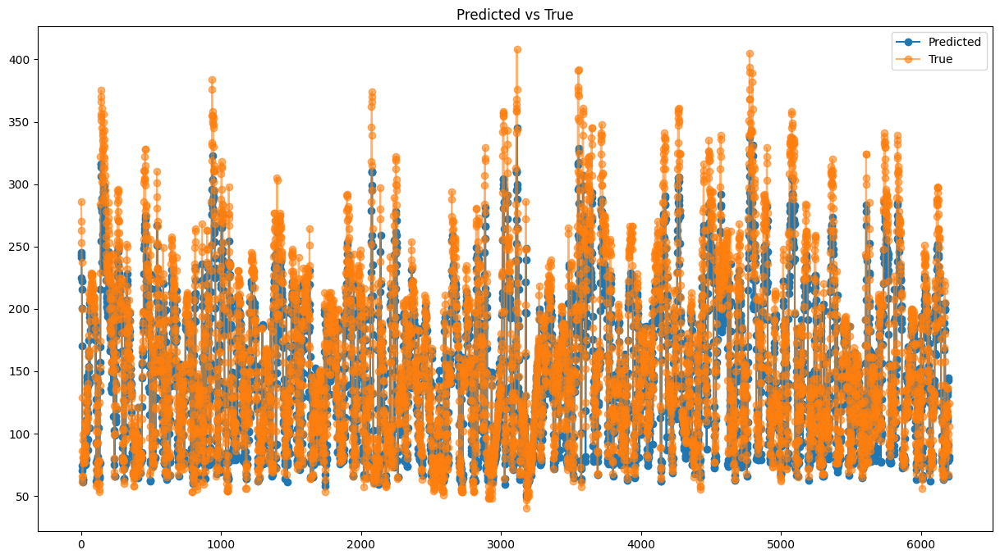

{'mae': 23.947884987605, 'mse': 32.31737847691723, 'rmse': 1044.4129516203127}

In [81]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [82]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [83]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,243.076141
2023-01-01 00:15:00,270.0,245.136459
2023-01-01 00:30:00,263.0,240.990967
2023-01-01 00:45:00,253.0,224.511612
2023-01-01 01:00:00,237.0,222.372803
...,...,...
2023-03-06 13:00:00,100.0,65.641167
2023-03-06 13:15:00,89.0,78.055840
2023-03-06 13:30:00,92.0,90.951309
2023-03-06 13:45:00,106.0,79.681358


AP, BE, EP: (0.8612903225806452, 0.09919354838709678, 0.03951612903225806)


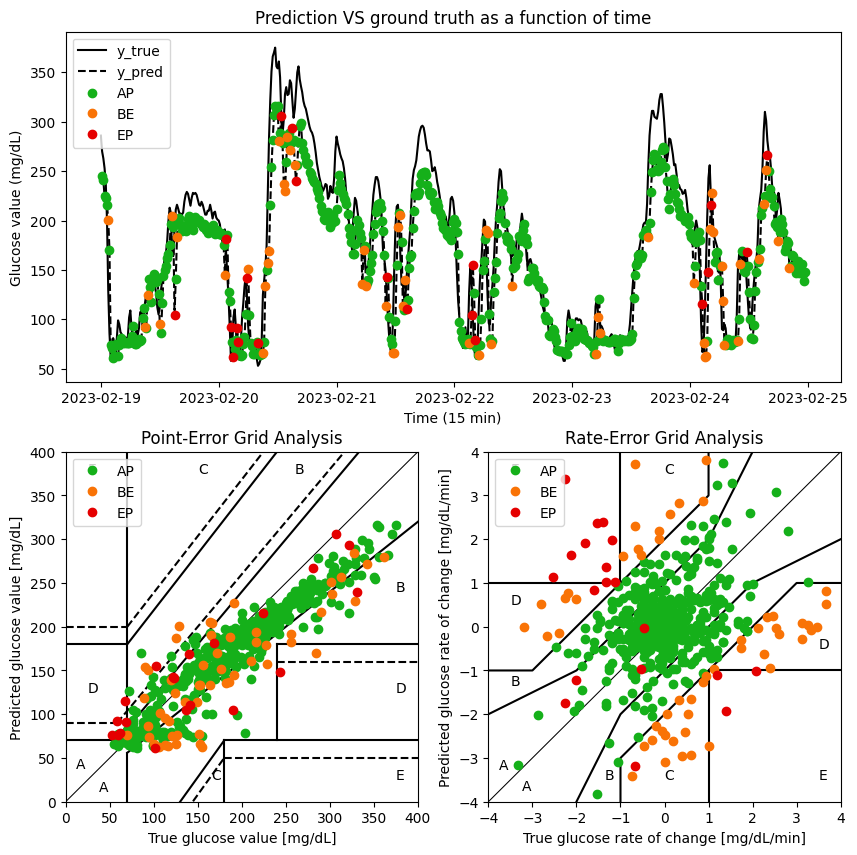

In [84]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [85]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,286.0,243.076141,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,270.0,245.136459,-1.066667,0.137355,AP,A,B
2,2023-02-19 00:30:00,263.0,240.990967,-0.466667,-0.276366,AP,A,A
3,2023-02-19 00:45:00,253.0,224.511612,-0.666667,-1.098624,AP,A,A
4,2023-02-19 01:00:00,237.0,222.372803,-1.066667,-0.142587,AP,A,A
...,...,...,...,...,...,...,...,...
6196,2023-04-24 13:00:00,100.0,65.641167,0.933333,-0.954363,AP,B,B
6197,2023-04-24 13:15:00,89.0,78.055840,-0.733333,0.827645,AP,A,B
6198,2023-04-24 13:30:00,92.0,90.951309,0.200000,0.859698,AP,A,A
6199,2023-04-24 13:45:00,106.0,79.681358,0.933333,-0.751330,AP,B,B


# Predicción a 60 min del conjunto de pruebas generales

In [86]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [87]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 48ms/step


,Glucose level Predict,Glucose level True
0,0.441470,0.534783
1,0.445949,0.500000


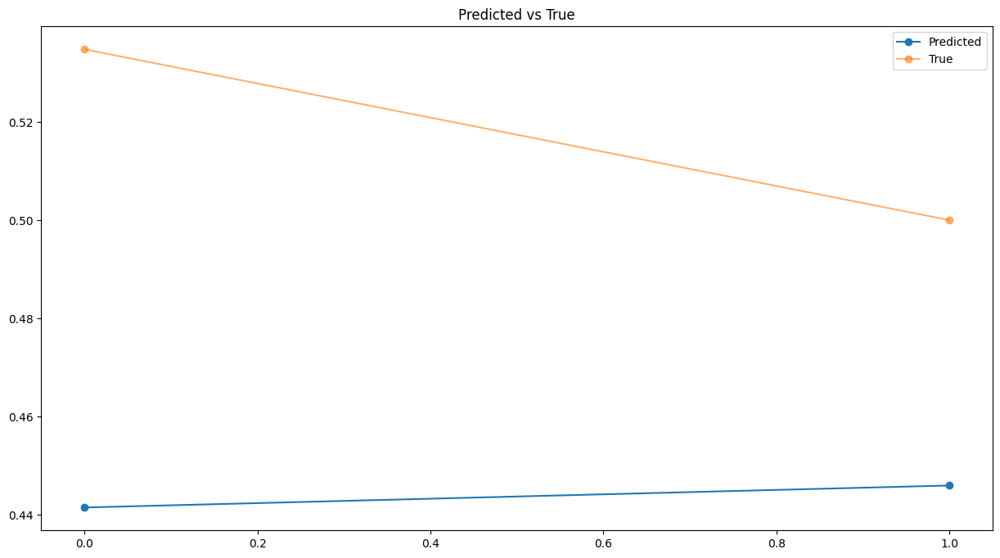

{'mae': 0.073681930873705,
 'mse': 0.0762521742016458,
 'rmse': 0.005814394070478138}

In [88]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [89]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,243.076141,286.0
1,245.136459,270.0


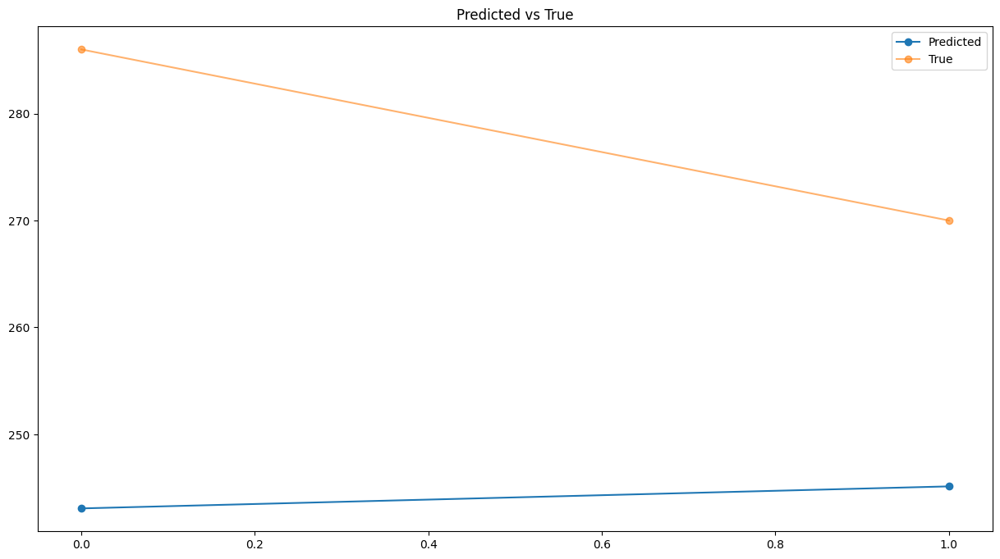

{'mae': 33.893699645996065,
 'mse': 35.07601241869642,
 'rmse': 1230.3266471965458}

In [90]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Bidirectional LSTM sin dropout

In [91]:
model = keras.models.load_model('modelos/'+paciente+'/bidirectional_NO_dropout_balanceado.h5')

# Predicción de todo el conjunto de pruebas generales

In [92]:
len(array_Ytest)

6201

194/194 [==============================] - 1s 5ms/step


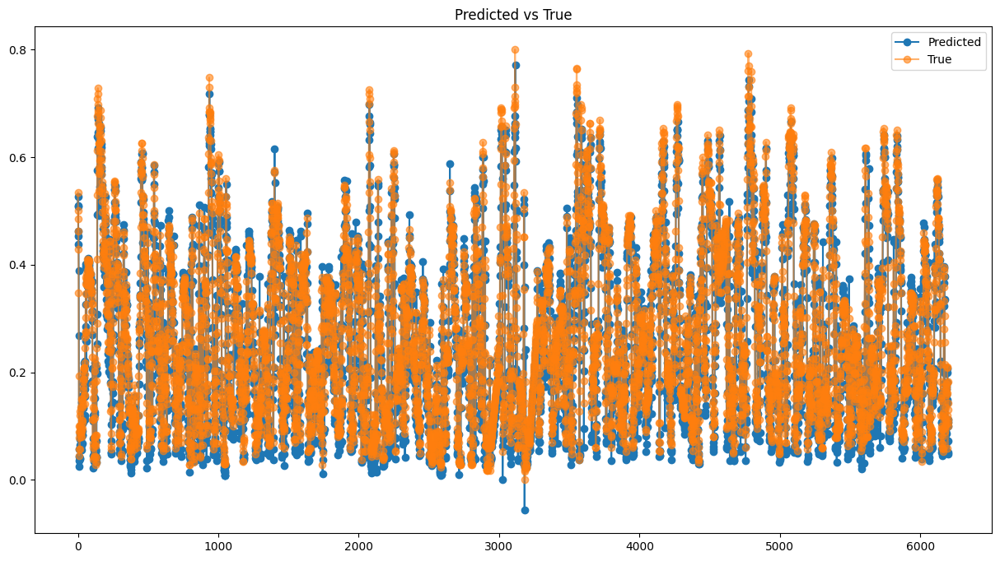

In [93]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [94]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.04112658658551121,
 'mse': 0.05838966237140196,
 'rmse': 0.0034093526718463143}

In [95]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,274.778778
1,282.219788
2,273.851349
3,248.347916
4,252.665176
...,...
6196,63.230492
6197,91.787659
6198,89.705055
6199,73.023727


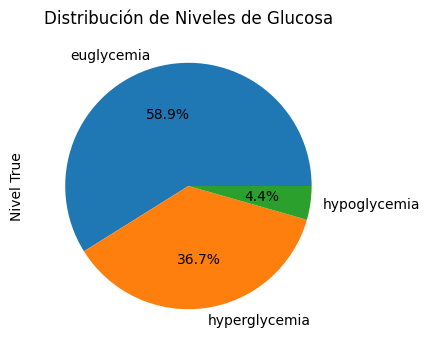

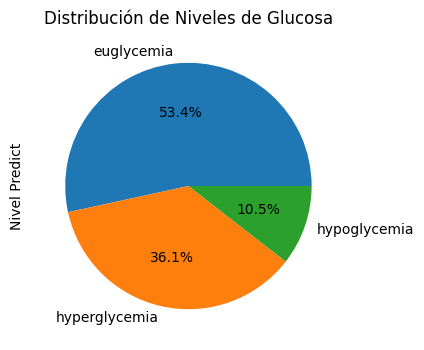

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,286.0,hyperglycemia,274.778778,hyperglycemia
1,270.0,hyperglycemia,282.219788,hyperglycemia
2,263.0,hyperglycemia,273.851349,hyperglycemia
3,253.0,hyperglycemia,248.347916,hyperglycemia
4,237.0,hyperglycemia,252.665176,hyperglycemia


In [96]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


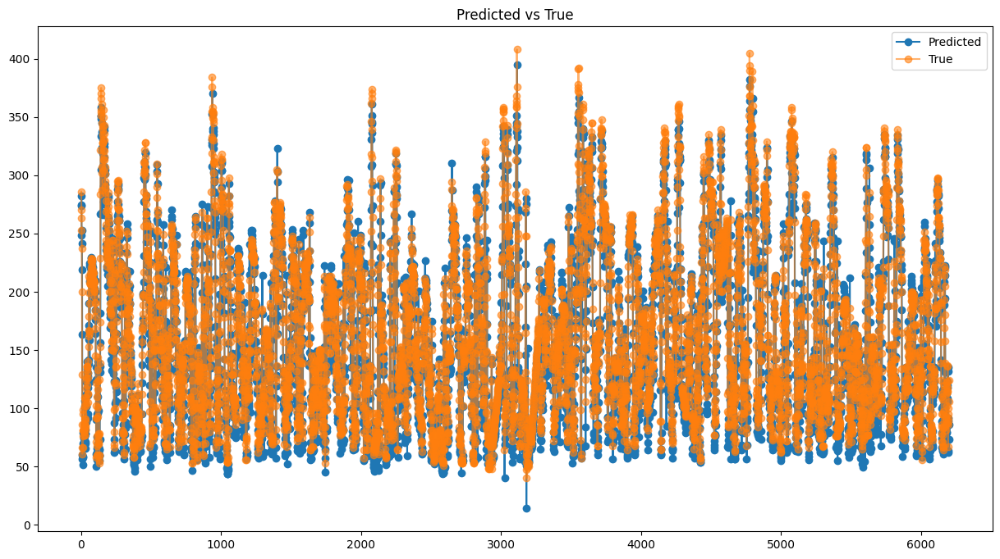

{'mae': 18.918230565870882,
 'mse': 26.859245145170178,
 'rmse': 721.4190497683477}

In [97]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [98]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,286.0
1,270.0
2,263.0
3,253.0
4,237.0
...,...
6196,100.0
6197,89.0
6198,92.0
6199,106.0


In [99]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,286.0,274.778778
2023-01-01 00:15:00,270.0,282.219788
2023-01-01 00:30:00,263.0,273.851349
2023-01-01 00:45:00,253.0,248.347916
2023-01-01 01:00:00,237.0,252.665176
...,...,...
2023-03-06 13:00:00,100.0,63.230492
2023-03-06 13:15:00,89.0,91.787659
2023-03-06 13:30:00,92.0,89.705055
2023-03-06 13:45:00,106.0,73.023727


AP, BE, EP: (0.8543548387096774, 0.10370967741935484, 0.041935483870967745)


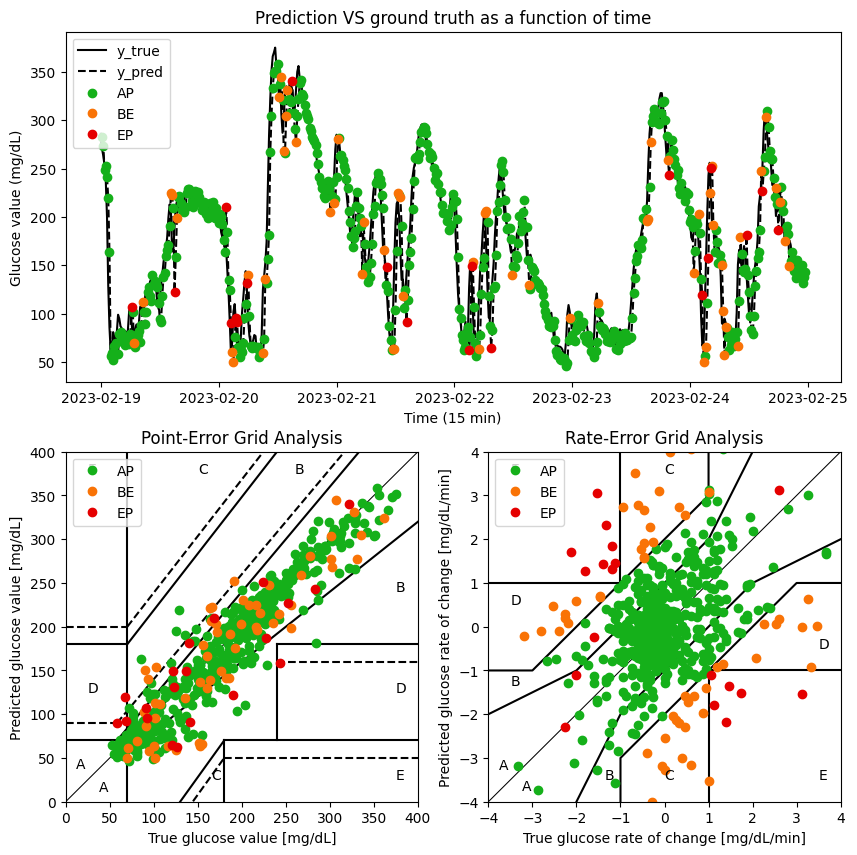

In [100]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [101]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-19 00:00:00,286.0,274.778778,NaN,NaN,NaN,NaN,NaN
1,2023-02-19 00:15:00,270.0,282.219788,-1.066667,0.496067,AP,A,B
2,2023-02-19 00:30:00,263.0,273.851349,-0.466667,-0.557896,AP,A,A
3,2023-02-19 00:45:00,253.0,248.347916,-0.666667,-1.700229,AP,A,B
4,2023-02-19 01:00:00,237.0,252.665176,-1.066667,0.287817,AP,A,B
...,...,...,...,...,...,...,...,...
6196,2023-04-24 13:00:00,100.0,63.230492,0.933333,0.052634,AP,B,A
6197,2023-04-24 13:15:00,89.0,91.787659,-0.733333,1.903811,BE,A,uC
6198,2023-04-24 13:30:00,92.0,89.705055,0.200000,-0.138840,AP,A,A
6199,2023-04-24 13:45:00,106.0,73.023727,0.933333,-1.112089,BE,B,lC


# Predicción a 60 min del conjunto de pruebas generales

In [102]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [103]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 58ms/step


,Glucose level Predict,Glucose level True
0,0.510389,0.534783
1,0.526565,0.500000


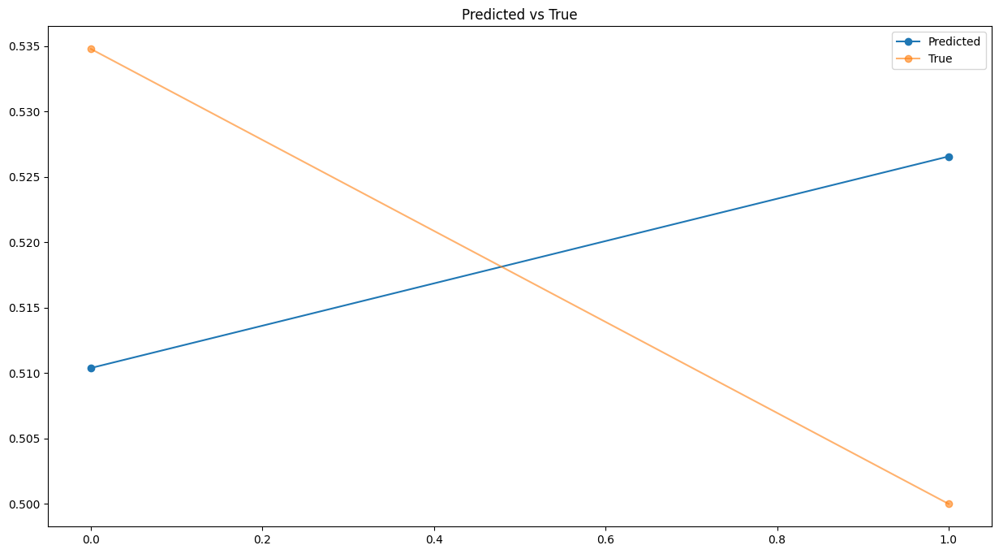

{'mae': 0.025479386422945116,
 'mse': 0.025502491556449708,
 'rmse': 0.0006503770755867887}

In [104]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [105]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,274.778717,286.0
1,282.219757,270.0


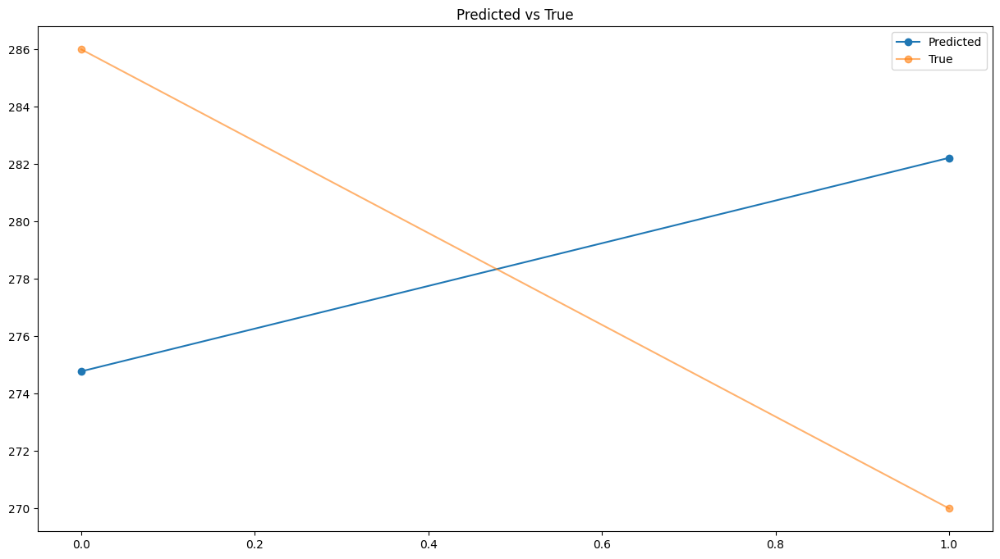

{'mae': 11.720520019531278,
 'mse': 11.731147734593447,
 'rmse': 137.61982717085698}

In [106]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)